In [91]:
import pandas as pd
import random
import numpy as np
from random import randint
import torch
from transformers import AutoTokenizer, AutoModel  # , RobertaModel
import adapters
from adapters import AutoAdapterModel
import gc

import scipy as sp
from scipy import sparse
import sklearn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import normalize

from openTSNE import TSNE, affinity

import matplotlib.pyplot as plt
import matplotlib

import time
import pickle
import memory_profiler

%load_ext memory_profiler

from pathlib import Path
import distro

%load_ext watermark

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler
The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark


In [3]:
torch.__version__

'2.1.1+cu121'

In [4]:
%load_ext autoreload
%autoreload 2
    
from metrics import knn_accuracy

In [4]:
# %load_ext autoreload
# %autoreload 2

# from text_embeddings_src.embeddings import generate_embeddings
# from text_embeddings_src.metrics import knn_accuracy, knn_recall
# from text_embeddings_src.plotting import (
#     plot_label_tags,
#     plot_tsne_colors,
#     improved_coloring,
# )

In [5]:
import black
import jupyter_black

jupyter_black.load(line_length=79)

In [92]:
variables_path = Path("../../results/variables")
figures_path = Path("../../results/figures/updated_dataset")
data_path = Path("../../data")
# berenslab_data_path = Path("/gpfs01/berens/data/data/GPT_wiki_intro")

In [7]:
plt.style.use("../matplotlib_style.txt")

In [8]:
%watermark -a 'Rita González-Márquez' -t -d -tz -u -v -iv -w -m -h -p transformers,openTSNE
print(distro.name(pretty=True))

Author: Rita González-Márquez

Last updated: 2024-03-12 03:55:44CET

Python implementation: CPython
Python version       : 3.11.5
IPython version      : 8.18.1

transformers: 4.35.2
openTSNE    : 1.0.0

Compiler    : GCC 11.2.0
OS          : Linux
Release     : 3.10.0-1160.el7.x86_64
Machine     : x86_64
Processor   : x86_64
CPU cores   : 64
Architecture: 64bit

Hostname: rgonzalesmarquez_GPU0-llm_gber7

torch          : 2.1.1
openTSNE       : 1.0.0
scipy          : 1.11.4
pandas         : 2.1.3
black          : 23.11.0
jupyter_black  : 0.3.4
sklearn        : 1.3.2
numpy          : 1.26.2
memory_profiler: 0.61.0
matplotlib     : 3.8.2
distro         : 1.8.0
adapters       : 0.1.0

Watermark: 2.4.3

Ubuntu 22.04.3 LTS


# Import

In [9]:
%%time
iclr2024 = pd.read_parquet(
    data_path / "iclr2024.parquet.gzip",
    # index=False,
    engine="pyarrow",
    # compression="gzip",
)

CPU times: user 281 ms, sys: 91.5 ms, total: 373 ms
Wall time: 279 ms


In [10]:
iclr2024.keywords = iclr2024.keywords.transform(lambda x: list(x))
iclr2024.scores = iclr2024.scores.transform(lambda x: list(x))

In [11]:
iclr2024

,index,year,id,title,abstract,authors,decision,scores,keywords,gender-first,gender-last,t-SNE x,t-SNE y
0,0,2017,S1VaB4cex,FractalNet: Ultra-Deep Neural Networks without...,We introduce a design strategy for neural netw...,"Gustav Larsson, Michael Maire, Gregory Shakhna...",Accept (Poster),"[5, 7, 6, 6]",[],male,male,-28.117955,-20.418127
1,1,2017,H1W1UN9gg,Deep Information Propagation,We study the behavior of untrained neural netw...,"Samuel S. Schoenholz, Justin Gilmer, Surya Gan...",Accept (Poster),"[8, 9, 8]","[theory, deep learning]",male,None,-32.466820,-10.791123
2,2,2017,r1GKzP5xx,Recurrent Normalization Propagation,We propose a LSTM parametrization that preser...,"César Laurent, Nicolas Ballas, Pascal Vincent",Invite to Workshop Track,"[4, 6, 6]","[deep learning, optimization]",None,male,3.504240,19.946053
3,3,2017,S1J0E-71l,Surprisal-Driven Feedback in Recurrent Networks,Recurrent neural nets are widely used for pred...,"K, a, m, i, l, , R, o, c, k, i",Reject,"[3, 4, 3]","[unsupervised learning, applications, deep lea...",None,None,4.553473,16.037763
4,4,2017,SJGCiw5gl,Pruning Convolutional Neural Networks for Reso...,We propose a new formulation for pruning convo...,"Pavlo Molchanov, Stephen Tyree, Tero Karras, T...",Accept (Poster),"[6, 7, 9]","[deep learning, transfer learning]",None,male,-25.827705,-37.891772
...,...,...,...,...,...,...,...,...,...,...,...,...,...
24342,7299,2024,1bbPQShCT2,I-PHYRE: Interactive Physical Reasoning,Current evaluation protocols predominantly ass...,,,[],"[intuitive physics, physical reasoning]",None,None,43.137120,44.316133
24343,7300,2024,Ny150AblPu,EXPOSING TEXT-IMAGE INCONSISTENCY USING DIFFUS...,In the battle against widespread online misinf...,,,[],"[mis-contextualization, media forensic]",None,None,59.742172,-22.673627
24344,7301,2024,ZGBOfAQrMl,Video Super-Resolution Transformer with Masked...,"Recently, Vision Transformer has achieved grea...",,,[],"[video super-resolution, adaptive, memory and ...",None,None,57.933273,-3.932825
24345,7302,2024,J2kRjUAOLh,Contrastive Predict-and-Search for Mixed Integ...,Mixed integer linear programs (MILP) are flex...,,,[],[mixed integer programs; contrastive learning],None,None,-11.437999,21.289523


In [12]:
labels_iclr = np.load(variables_path / "updated_dataset" / "labels_iclr.npy")
colors_iclr = np.load(variables_path / "updated_dataset" / "colors_iclr.npy")

pickle_in = open(
    variables_path / "updated_dataset" / "dict_label_to_color.pkl", "rb"
)
dict_label_to_color = pickle.load(pickle_in)

In [93]:
# labels_iclr = np.load(variables_path / "updated_dataset" / "labels_iclr.npy")
colors_iclr_2 = np.load(
    variables_path / "updated_dataset" / "colors_iclr_2.npy"
)

pickle_in = open(
    variables_path / "updated_dataset" / "dict_label_to_color_2.pkl", "rb"
)
dict_label_to_color_2 = pickle.load(pickle_in)

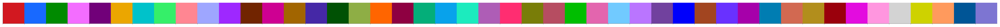

In [98]:
%matplotlib inline
import seaborn as sns

len(list(dict_label_to_color_2.values()))
sns.palplot(list(dict_label_to_color_2.values()))

In [14]:
# sanity check
print(len(np.unique(labels_iclr)))
labels_iclr

46


array(['unlabeled', 'unlabeled', 'optimization', ..., 'unlabeled',
       'unlabeled', 'federated learning'], dtype='<U34')

In [15]:
# sanity check

print(np.sum([labels_iclr == "unlabeled"]))
print(np.sum([labels_iclr != "unlabeled"]))

11350
12997


## Save version ICLR

In [56]:
iclr2024.columns

Index(['index', 'year', 'id', 'title', 'abstract', 'authors', 'decision',
       'scores', 'keywords', 'gender-first', 'gender-last', 't-SNE x',
       't-SNE y'],
      dtype='object')

In [62]:
df_copy = iclr2024[
    [
        # "index",
        "year",
        "id",
        "title",
        "abstract",
        "authors",
        "decision",
        "scores",
        "keywords",
    ]
].copy(deep=True)

In [63]:
df_copy.head()

,year,id,title,abstract,authors,decision,scores,keywords
0,2017,S1VaB4cex,FractalNet: Ultra-Deep Neural Networks without...,We introduce a design strategy for neural netw...,"Gustav Larsson, Michael Maire, Gregory Shakhna...",Accept (Poster),"[5, 7, 6, 6]",[]
1,2017,H1W1UN9gg,Deep Information Propagation,We study the behavior of untrained neural netw...,"Samuel S. Schoenholz, Justin Gilmer, Surya Gan...",Accept (Poster),"[8, 9, 8]","[theory, deep learning]"
2,2017,r1GKzP5xx,Recurrent Normalization Propagation,We propose a LSTM parametrization that preser...,"César Laurent, Nicolas Ballas, Pascal Vincent",Invite to Workshop Track,"[4, 6, 6]","[deep learning, optimization]"
3,2017,S1J0E-71l,Surprisal-Driven Feedback in Recurrent Networks,Recurrent neural nets are widely used for pred...,"K, a, m, i, l, , R, o, c, k, i",Reject,"[3, 4, 3]","[unsupervised learning, applications, deep lea..."
4,2017,SJGCiw5gl,Pruning Convolutional Neural Networks for Reso...,We propose a new formulation for pruning convo...,"Pavlo Molchanov, Stephen Tyree, Tero Karras, T...",Accept (Poster),"[6, 7, 9]","[deep learning, transfer learning]"


In [64]:
df_copy["labels"] = labels_iclr

In [65]:
df_copy.head()

,year,id,title,abstract,authors,decision,scores,keywords,labels
0,2017,S1VaB4cex,FractalNet: Ultra-Deep Neural Networks without...,We introduce a design strategy for neural netw...,"Gustav Larsson, Michael Maire, Gregory Shakhna...",Accept (Poster),"[5, 7, 6, 6]",[],unlabeled
1,2017,H1W1UN9gg,Deep Information Propagation,We study the behavior of untrained neural netw...,"Samuel S. Schoenholz, Justin Gilmer, Surya Gan...",Accept (Poster),"[8, 9, 8]","[theory, deep learning]",unlabeled
2,2017,r1GKzP5xx,Recurrent Normalization Propagation,We propose a LSTM parametrization that preser...,"César Laurent, Nicolas Ballas, Pascal Vincent",Invite to Workshop Track,"[4, 6, 6]","[deep learning, optimization]",optimization
3,2017,S1J0E-71l,Surprisal-Driven Feedback in Recurrent Networks,Recurrent neural nets are widely used for pred...,"K, a, m, i, l, , R, o, c, k, i",Reject,"[3, 4, 3]","[unsupervised learning, applications, deep lea...",unlabeled
4,2017,SJGCiw5gl,Pruning Convolutional Neural Networks for Reso...,We propose a new formulation for pruning convo...,"Pavlo Molchanov, Stephen Tyree, Tero Karras, T...",Accept (Poster),"[6, 7, 9]","[deep learning, transfer learning]",transfer learning


In [66]:
# %%time
df_copy.to_parquet(
    "/gpfs01/berens/user/rgonzalesmarquez/phd/iclr-dataset/data/iclr24v1.parquet.gzip",  # ICLR24v1
    index=False,
    engine="pyarrow",
    compression="gzip",
)

In [69]:
# %%time
df_copy_test = pd.read_parquet(
    "/gpfs01/berens/user/rgonzalesmarquez/phd/iclr-dataset/data/iclr24v1.parquet.gzip",  # ICLR24v1
    engine="pyarrow",
)

In [70]:
df_copy_test

,year,id,title,abstract,authors,decision,scores,keywords,labels
0,2017,S1VaB4cex,FractalNet: Ultra-Deep Neural Networks without...,We introduce a design strategy for neural netw...,"Gustav Larsson, Michael Maire, Gregory Shakhna...",Accept (Poster),"[5, 7, 6, 6]",[],unlabeled
1,2017,H1W1UN9gg,Deep Information Propagation,We study the behavior of untrained neural netw...,"Samuel S. Schoenholz, Justin Gilmer, Surya Gan...",Accept (Poster),"[8, 9, 8]","[theory, deep learning]",unlabeled
2,2017,r1GKzP5xx,Recurrent Normalization Propagation,We propose a LSTM parametrization that preser...,"César Laurent, Nicolas Ballas, Pascal Vincent",Invite to Workshop Track,"[4, 6, 6]","[deep learning, optimization]",optimization
3,2017,S1J0E-71l,Surprisal-Driven Feedback in Recurrent Networks,Recurrent neural nets are widely used for pred...,"K, a, m, i, l, , R, o, c, k, i",Reject,"[3, 4, 3]","[unsupervised learning, applications, deep lea...",unlabeled
4,2017,SJGCiw5gl,Pruning Convolutional Neural Networks for Reso...,We propose a new formulation for pruning convo...,"Pavlo Molchanov, Stephen Tyree, Tero Karras, T...",Accept (Poster),"[6, 7, 9]","[deep learning, transfer learning]",transfer learning
...,...,...,...,...,...,...,...,...,...
24342,2024,1bbPQShCT2,I-PHYRE: Interactive Physical Reasoning,Current evaluation protocols predominantly ass...,,,[],"[intuitive physics, physical reasoning]",unlabeled
24343,2024,Ny150AblPu,EXPOSING TEXT-IMAGE INCONSISTENCY USING DIFFUS...,In the battle against widespread online misinf...,,,[],"[mis-contextualization, media forensic]",unlabeled
24344,2024,ZGBOfAQrMl,Video Super-Resolution Transformer with Masked...,"Recently, Vision Transformer has achieved grea...",,,[],"[video super-resolution, adaptive, memory and ...",unlabeled
24345,2024,J2kRjUAOLh,Contrastive Predict-and-Search for Mixed Integ...,Mixed integer linear programs (MILP) are flex...,,,[],[mixed integer programs; contrastive learning],unlabeled


In [75]:
for elem in df_copy_test.columns:
    print("- ", elem.capitalize())

-  Year
-  Id
-  Title
-  Abstract
-  Authors
-  Decision
-  Scores
-  Keywords
-  Labels


In [80]:
df_copy_test.iloc[42].to_dict()

{'year': 2017,
 'id': 'r1nTpv9eg',
 'title': 'Learning to Perform Physics Experiments via Deep Reinforcement Learning',
 'abstract': 'When encountering novel objects, humans are able to infer a wide range of physical properties such as mass, friction and deformability by interacting with them in a goal driven way. This process of active interaction is in the same spirit as a scientist performing experiments to discover hidden facts. Recent advances in artificial intelligence have yielded machines that can achieve superhuman performance in Go, Atari, natural language processing, and complex control problems; however, it is not clear that these systems can rival the scientific intuition of even a young child. In this work we introduce a basic set of tasks that require agents to estimate properties such as mass and cohesion of objects in an interactive simulated environment where they can manipulate the objects and observe the consequences. We found that deep reinforcement learning method

In [ ]:
Model | $k$NN accuracy
--- | ---
TF-IDF | 60.0%
SVD | 60.6%
SVD, $L_2$ norm. | 62.4%
--- | ---
DeCLUTR-sci | 53.5% 
SciNCL | 57.0%  
SPECTER2 | 58.2%  
Cohere Embed | 62.9%
SBERT | **63.3%**

In [81]:
%%time
iclr24v1 = pd.read_parquet(
    data_path / "iclr24v1.parquet.gzip",
    # index=False,
    engine="pyarrow",
    # compression="gzip",
)

CPU times: user 352 ms, sys: 119 ms, total: 471 ms
Wall time: 477 ms


In [82]:
iclr24v1

,year,id,title,abstract,authors,decision,scores,keywords,labels
0,2017,S1VaB4cex,FractalNet: Ultra-Deep Neural Networks without...,We introduce a design strategy for neural netw...,"Gustav Larsson, Michael Maire, Gregory Shakhna...",Accept (Poster),"[5, 7, 6, 6]",[],unlabeled
1,2017,H1W1UN9gg,Deep Information Propagation,We study the behavior of untrained neural netw...,"Samuel S. Schoenholz, Justin Gilmer, Surya Gan...",Accept (Poster),"[8, 9, 8]","[theory, deep learning]",unlabeled
2,2017,r1GKzP5xx,Recurrent Normalization Propagation,We propose a LSTM parametrization that preser...,"César Laurent, Nicolas Ballas, Pascal Vincent",Invite to Workshop Track,"[4, 6, 6]","[deep learning, optimization]",optimization
3,2017,S1J0E-71l,Surprisal-Driven Feedback in Recurrent Networks,Recurrent neural nets are widely used for pred...,"K, a, m, i, l, , R, o, c, k, i",Reject,"[3, 4, 3]","[unsupervised learning, applications, deep lea...",unlabeled
4,2017,SJGCiw5gl,Pruning Convolutional Neural Networks for Reso...,We propose a new formulation for pruning convo...,"Pavlo Molchanov, Stephen Tyree, Tero Karras, T...",Accept (Poster),"[6, 7, 9]","[deep learning, transfer learning]",transfer learning
...,...,...,...,...,...,...,...,...,...
24342,2024,1bbPQShCT2,I-PHYRE: Interactive Physical Reasoning,Current evaluation protocols predominantly ass...,,,[],"[intuitive physics, physical reasoning]",unlabeled
24343,2024,Ny150AblPu,EXPOSING TEXT-IMAGE INCONSISTENCY USING DIFFUS...,In the battle against widespread online misinf...,,,[],"[mis-contextualization, media forensic]",unlabeled
24344,2024,ZGBOfAQrMl,Video Super-Resolution Transformer with Masked...,"Recently, Vision Transformer has achieved grea...",,,[],"[video super-resolution, adaptive, memory and ...",unlabeled
24345,2024,J2kRjUAOLh,Contrastive Predict-and-Search for Mixed Integ...,Mixed integer linear programs (MILP) are flex...,,,[],[mixed integer programs; contrastive learning],unlabeled


###  Check PubMed status

In [95]:
print(
    np.load(
        "/gpfs01/berens/data/data/pubmed_processed/embeddings/2024_baseline/last_i_batch.npy"
    )
)

69000


In [2]:
(69000) * 256 / 23389083

0.755224135978311

# Representation

## BERT-based models

In [21]:
model_names = [
    "BERT",
    "MPNet",
    "SBERT",
    "SciBERT",
    "SPECTER",
    "SciNCL",
]

rep = ["av", "sep", "cls"]

model_paths = [
    "bert-base-uncased",
    "microsoft/mpnet-base",
    "sentence-transformers/all-mpnet-base-v2",
    "allenai/scibert_scivocab_uncased",
    "allenai/specter",
    "malteos/scincl",
]

In [14]:
%%time
for i, model_name in enumerate(model_names):
    # set up model
    print('Model: ', model_name)
    
    random_state = random.seed(42)
    device = (
        "cuda" if torch.cuda.is_available() else "cpu"
    )  
    print("Running on device: {}".format(device))

    tokenizer = AutoTokenizer.from_pretrained(model_paths[i])
    model = AutoModel.from_pretrained(model_paths[i])
    print(model_paths[i])

    model = model.to(device)

    # get embeddings
    embedding_cls, embedding_sep, embedding_av = generate_embeddings(iclr2024.abstract.to_list(), tokenizer, model, device, batch_size=256)

    # save embeddings
    saving_path = Path("embeddings_" + model_name.lower()) / Path("updated_dataset")
    (variables_path / saving_path).mkdir(exist_ok=True)

    np.save(variables_path/saving_path/"embedding_abstracts_only_cls", embedding_cls)
    np.save(variables_path/saving_path/"embedding_abstracts_only_sep", embedding_sep)
    np.save(variables_path/saving_path/"embedding_abstracts_only_av", embedding_av)
    
    model = None
    gc.collect()
    torch.cuda.empty_cache()

    print('----------------------------')



Model:  BERT
Running on device: cuda
bert-base-uncased


  0%|          | 0/96 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

----------------------------
Model:  MPNet
Running on device: cuda


model.safetensors:   0%|          | 0.00/532M [00:00<?, ?B/s]

Some weights of MPNetModel were not initialized from the model checkpoint at microsoft/mpnet-base and are newly initialized: ['mpnet.pooler.dense.bias', 'mpnet.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


microsoft/mpnet-base


  0%|          | 0/96 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

----------------------------
Model:  SBERT
Running on device: cuda
sentence-transformers/all-mpnet-base-v2


  0%|          | 0/96 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

----------------------------
Model:  SciBERT
Running on device: cuda
allenai/scibert_scivocab_uncased


  0%|          | 0/96 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

----------------------------
Model:  SPECTER
Running on device: cuda
allenai/specter


  0%|          | 0/96 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

----------------------------
Model:  SciNCL
Running on device: cuda


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

malteos/scincl


  0%|          | 0/96 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

----------------------------
CPU times: user 11min 46s, sys: 18min 51s, total: 30min 38s
Wall time: 21min


### Add new models

In [30]:
model_names = [
    "SimCSE",
    "DeCLUTR",
    "DeCLUTR-sci",
    # "SPECTER2",
]


model_paths = [
    "princeton-nlp/unsup-simcse-bert-base-uncased",
    "johngiorgi/declutr-base",
    "johngiorgi/declutr-sci-base",
    # "allenai/specter2_base",
]
print(model_names)

['SimCSE', 'DeCLUTR', 'DeCLUTR-sci']


In [31]:
%%time
for i, model_name in enumerate(model_names):
    # set up model
    print('Model: ', model_name)
    
    random_state = random.seed(42)
    device = (
        "cuda" if torch.cuda.is_available() else "cpu"
    )  
    print("Running on device: {}".format(device))

    tokenizer = AutoTokenizer.from_pretrained(model_paths[i])
    model = AutoModel.from_pretrained(model_paths[i])
    print(model_paths[i])

    model = model.to(device)

    # get embeddings
    embedding_cls, embedding_sep, embedding_av = generate_embeddings(iclr2024.abstract.to_list(), tokenizer, model, device, batch_size=256)

    # save embeddings
    saving_path = Path("embeddings_" + model_name.lower()) / Path("updated_dataset")
    (variables_path / saving_path).mkdir(parents=True,exist_ok=True)

    np.save(variables_path/saving_path/"embedding_abstracts_only_cls", embedding_cls)
    np.save(variables_path/saving_path/"embedding_abstracts_only_sep", embedding_sep)
    np.save(variables_path/saving_path/"embedding_abstracts_only_av", embedding_av)
    
    model = None
    gc.collect()
    torch.cuda.empty_cache()

    print('----------------------------')



Model:  SimCSE
Running on device: cuda


princeton-nlp/unsup-simcse-bert-base-uncased


  0%|          | 0/96 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

----------------------------
Model:  DeCLUTR
Running on device: cuda
johngiorgi/declutr-base


  0%|          | 0/96 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

----------------------------
Model:  DeCLUTR-sci
Running on device: cuda
johngiorgi/declutr-sci-base


  0%|          | 0/96 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

----------------------------
CPU times: user 5min 13s, sys: 8min 56s, total: 14min 9s
Wall time: 10min 2s


In [14]:
%%time
# SPECTER 2
model_name = "SPECTER2"
model_path = "allenai/specter2_base"

# set up model
print('Model: ', model_name)

random_state = random.seed(42)
device = (
    "cuda" if torch.cuda.is_available() else "cpu"
)  
print("Running on device: {}".format(device))

tokenizer = AutoTokenizer.from_pretrained(model_path)
model = AutoAdapterModel.from_pretrained(model_path)
print(model_path)
# add adapter proximity
#load the adapter(s) as per the required task, provide an identifier for the adapter in load_as argument and activate it
model.load_adapter("allenai/specter2", source="hf", load_as="specter2", set_active=True)

model = model.to(device)

# get embeddings
embedding_cls, embedding_sep, embedding_av = generate_embeddings(iclr2024.abstract.to_list(), tokenizer, model, device, batch_size=256)

# save embeddings
saving_path = Path("embeddings_" + model_name.lower()) / Path("updated_dataset")
(variables_path / saving_path).mkdir(parents=True,exist_ok=True)

np.save(variables_path/saving_path/"embedding_abstracts_only_cls", embedding_cls)
np.save(variables_path/saving_path/"embedding_abstracts_only_sep", embedding_sep)
np.save(variables_path/saving_path/"embedding_abstracts_only_av", embedding_av)

model = None
gc.collect()
torch.cuda.empty_cache()

print('----------------------------')



Model:  SPECTER2
Running on device: cuda
allenai/specter2_base


Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]

README.md:   0%|          | 0.00/9.55k [00:00<?, ?B/s]

.gitattributes:   0%|          | 0.00/1.48k [00:00<?, ?B/s]

adapter_config.json:   0%|          | 0.00/1.03k [00:00<?, ?B/s]

pytorch_adapter.bin:   0%|          | 0.00/3.59M [00:00<?, ?B/s]

  0%|          | 0/96 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

----------------------------
CPU times: user 1min 41s, sys: 3min 11s, total: 4min 52s
Wall time: 3min 34s


### Add ST5

#### Exploration of Sentence Transformers

When sentence_transformers is used in output_value="token_embeddings" mode, a "end of senctence" ("eos", similar to CLS) token is appended at the end of the sentence before the padding. The output of model.encode is a list though, and it has no padding tokens in every element, so the EOS token is just the last one.

I dont really know what the output is in mode output_value="sentence_embeddings", but I asume mean pooling of all tokens.

In [17]:
from sentence_transformers import SentenceTransformer

import sentence_transformers

sentence_transformers.__version__

'2.5.1'

In [31]:
?SentenceTransformer

Init signature:
SentenceTransformer(
    model_name_or_path: Optional[str] = None,
    modules: Optional[Iterable[torch.nn.modules.module.Module]] = None,
    device: Optional[str] = None,
    prompts: Optional[Dict[str, str]] = None,
    default_prompt_name: Optional[str] = None,
    cache_folder: Optional[str] = None,
    trust_remote_code: bool = False,
    revision: Optional[str] = None,
    token: Union[bool, str, NoneType] = None,
    use_auth_token: Union[bool, str, NoneType] = None,
)
Docstring:     
Loads or creates a SentenceTransformer model that can be used to map sentences / text to embeddings.

:param model_name_or_path: If it is a filepath on disc, it loads the model from that path. If it is not a path,
    it first tries to download a pre-trained SentenceTransformer model. If that fails, tries to construct a model
    from the Hugging Face Hub with that name.
:param modules: A list of torch Modules that should be called sequentially, can be used to create custom
    Sen

In [39]:
sentences = ["This is an example sentence", "Each sentence is converted"]

model = SentenceTransformer(
    "sentence-transformers/sentence-t5-base"
)  # , device="cuda")
embeddings = model.encode(
    sentences, output_value="token_embeddings", convert_to_tensor=True
)
print(embeddings)
print(type(embeddings))
print(embeddings[0].shape)
print(embeddings[1].shape)

[tensor([[ 0.1087,  0.0407, -0.1398,  ...,  0.1000, -0.0860, -0.0583],
        [-0.0079,  0.0146, -0.0060,  ...,  0.0283,  0.0054, -0.0067],
        [-0.0089, -0.0094, -0.0028,  ...,  0.0096,  0.0080, -0.0116],
        [ 0.1018,  0.0015, -0.1868,  ...,  0.0138,  0.3689,  0.0749],
        [-0.1467,  0.1837, -0.1458,  ..., -0.2221,  0.5728, -0.1461],
        [ 0.0171,  0.1270, -0.0777,  ..., -0.0599,  0.1117, -0.1966]],
       device='cuda:0'), tensor([[ 0.0587,  0.0733, -0.0882,  ...,  0.0740, -0.1640,  0.0976],
        [ 0.0183,  0.1378, -0.1671,  ...,  0.0997,  0.5533, -0.4041],
        [-0.0381, -0.0192,  0.0094,  ...,  0.0156,  0.0545, -0.0220],
        [-0.2468,  0.0537, -0.3107,  ...,  0.2940,  0.3538, -0.0822],
        [ 0.0220,  0.1275, -0.0723,  ..., -0.0507,  0.1181, -0.1882]],
       device='cuda:0')]
<class 'list'>
torch.Size([6, 768])
torch.Size([5, 768])


In [33]:
model.tokenize(sentences)

{'input_ids': tensor([[  100,    19,    46,   677,  7142,     1],
         [ 1698,  7142,    19, 12069,     1,     0]]),
 'attention_mask': tensor([[1, 1, 1, 1, 1, 1],
         [1, 1, 1, 1, 1, 0]])}

In [35]:
model.tokenizer  # .decode(sentences)

T5TokenizerFast(name_or_path='sentence-transformers/sentence-t5-base', vocab_size=32100, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'eos_token': '</s>', 'unk_token': '<unk>', 'pad_token': '<pad>', 'additional_special_tokens': ['<extra_id_0>', '<extra_id_1>', '<extra_id_2>', '<extra_id_3>', '<extra_id_4>', '<extra_id_5>', '<extra_id_6>', '<extra_id_7>', '<extra_id_8>', '<extra_id_9>', '<extra_id_10>', '<extra_id_11>', '<extra_id_12>', '<extra_id_13>', '<extra_id_14>', '<extra_id_15>', '<extra_id_16>', '<extra_id_17>', '<extra_id_18>', '<extra_id_19>', '<extra_id_20>', '<extra_id_21>', '<extra_id_22>', '<extra_id_23>', '<extra_id_24>', '<extra_id_25>', '<extra_id_26>', '<extra_id_27>', '<extra_id_28>', '<extra_id_29>', '<extra_id_30>', '<extra_id_31>', '<extra_id_32>', '<extra_id_33>', '<extra_id_34>', '<extra_id_35>', '<extra_id_36>', '<extra_id_37>', '<extra_id_38>', '<extra_id_39>', '<extra_id_40>', '<extra_id_41>', '<extra_id_42

In [57]:
model.tokenizer.decode(
    token_ids=model.tokenize(sentences)["input_ids"][0].numpy()
)

'This is an example sentence</s>'

In [21]:
?model.encode(batch_size = 256, show_progress_bar=True, device="cuda",normalize_embeddings=False

Signature:
model.encode(
    sentences: Union[str, List[str]],
    prompt_name: Optional[str] = None,
    prompt: Optional[str] = None,
    batch_size: int = 32,
    show_progress_bar: bool = None,
    output_value: str = 'sentence_embedding',
    convert_to_numpy: bool = True,
    convert_to_tensor: bool = False,
    device: str = None,
    normalize_embeddings: bool = False,
) -> Union[List[torch.Tensor], numpy.ndarray, torch.Tensor]
Docstring:
Computes sentence embeddings.

:param sentences: the sentences to embed.
:param prompt_name: The name of the prompt to use for encoding. Must be a key in the `prompts` dictionary,
    which is either set in the constructor or loaded from the model configuration. For example if
    `prompt_name` is ``"query"`` and the `prompts` is ``{"query": "query: ", ...}``, then the sentence "What
    is the capital of France?" will be encoded as "query: What is the capital of France?" because the sentence
    is appended to the prompt. If `prompt` is also 

In [24]:
# preprocess the input
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

inputs = tokenizer(
    sentences,
    padding=True,
    truncation=True,
    return_tensors="pt",
    max_length=512,
)  # .to(device)

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

In [47]:
print(inputs["input_ids"].shape)
inputs["input_ids"].numpy()

torch.Size([2, 7])


array([[ 101, 2023, 2003, 2019, 2742, 6251,  102],
       [ 101, 2169, 6251, 2003, 4991,  102,    0]])

In [49]:
# ?tokenizer.decode
tokenizer.decode(token_ids=inputs["input_ids"].numpy()[0])

'[CLS] this is an example sentence [SEP]'

#### Run for my data

In [58]:
model_names = [
    "ST5",
]


model_paths = [
    "sentence-transformers/sentence-t5-base",
]
print(model_names)

['ST5']


In [61]:
%%time
i = 0
model_name = model_names[i]

# set up model
print("Model: ", model_name)

random_state = random.seed(42)
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Running on device: {}".format(device))

print(model_paths[i])
model = SentenceTransformer(model_paths[i], device="cuda")

# get embeddings
embedding_av = model.encode(
    iclr2024.abstract.to_list(),
    batch_size=256,
    show_progress_bar=True,
    output_value="sentence_embedding",
    device="cuda",
    normalize_embeddings=False,  # the output is still normalized for some reason
)

# save embeddings
saving_path = Path("embeddings_" + model_name.lower()) / Path(
    "updated_dataset"
)
(variables_path / saving_path).mkdir(parents=True, exist_ok=True)

# np.save(
#     variables_path / saving_path / "embedding_abstracts_only_cls",
#     embedding_cls,
# )
# np.save(variables_path/saving_path/"embedding_abstracts_only_sep", embedding_sep)
np.save(
    variables_path / saving_path / "embedding_abstracts_only_av", embedding_av
)

model = None
gc.collect()
torch.cuda.empty_cache()

Model:  ST5
Running on device: cuda
sentence-transformers/sentence-t5-base


Batches:   0%|          | 0/96 [00:00<?, ?it/s]

CPU times: user 2min 42s, sys: 1min 17s, total: 4min
Wall time: 1min 25s


### With titles

In [14]:
titles_abstracts_together = [
    iclr2024.title[i] + " " + iclr2024.abstract[i]
    for i in range(len(iclr2024))
]

In [15]:
print(len(titles_abstracts_together))

24347


In [16]:
model_names = [
    "SBERT",
    # "DeCLUTR",
    # "DeCLUTR-sci",
    # # "SPECTER2",
]


model_paths = [
    "sentence-transformers/all-mpnet-base-v2",
    # "johngiorgi/declutr-base",
    # "johngiorgi/declutr-sci-base",
    # # "allenai/specter2_base",
]
print(model_names)

['SBERT']


In [17]:
%%time
for i, model_name in enumerate(model_names):
    # set up model
    print('Model: ', model_name)
    
    random_state = random.seed(42)
    device = (
        "cuda" if torch.cuda.is_available() else "cpu"
    )  
    print("Running on device: {}".format(device))

    tokenizer = AutoTokenizer.from_pretrained(model_paths[i])
    model = AutoModel.from_pretrained(model_paths[i])
    print(model_paths[i])

    model = model.to(device)

    # get embeddings
    embedding_cls, embedding_sep, embedding_av = generate_embeddings(titles_abstracts_together, tokenizer, model, device, batch_size=128)

    # save embeddings
    saving_path = Path("embeddings_" + model_name.lower()) / Path("updated_dataset")
    (variables_path / saving_path).mkdir(parents=True,exist_ok=True)

    np.save(variables_path/saving_path/"embedding_cls", embedding_cls)
    np.save(variables_path/saving_path/"embedding_sep", embedding_sep)
    np.save(variables_path/saving_path/"embedding_av", embedding_av)
    
    model = None
    gc.collect()
    torch.cuda.empty_cache()

    print('----------------------------')



Model:  SBERT
Running on device: cuda
sentence-transformers/all-mpnet-base-v2


  0%|          | 0/191 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

----------------------------
CPU times: user 2min 44s, sys: 8min 32s, total: 11min 16s
Wall time: 9min 58s


## TF-IDF

In [16]:
%%time
%%memit

# TfidfVectorizer
vectorizer = TfidfVectorizer(sublinear_tf=True)
tfidf_features = vectorizer.fit_transform(iclr2024.abstract.to_list())

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


peak memory: 3704.16 MiB, increment: 0.02 MiB
CPU times: user 2.49 s, sys: 184 ms, total: 2.67 s
Wall time: 2.84 s


In [17]:
print(tfidf_features.shape)

(24347, 44189)


In [18]:
# save results
sp.sparse.save_npz(variables_path / "updated_dataset" / "tfidf_features", tfidf_features)

### Truncated SVD

In [19]:
%%time
%%memit

# TruncatedSVD
svd = TruncatedSVD(n_components=768, random_state=42, algorithm="arpack")
svd_data = svd.fit_transform(tfidf_features)

# save results
np.save(variables_path / "updated_dataset" / "svd_data", svd_data)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


peak memory: 3704.11 MiB, increment: 0.00 MiB
CPU times: user 52min 5s, sys: 1h 3min 20s, total: 1h 55min 26s
Wall time: 2min 47s


### RP

In [20]:
%%time
%%memit
np.random.seed(42)
P = 2 * np.random.randint(0, 2, size=(tfidf_features.shape[1], 768)) - 1
random_projection = tfidf_features @ P
print(random_projection.shape)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


(24347, 768)
peak memory: 3220.09 MiB, increment: 140.10 MiB
CPU times: user 1.34 s, sys: 274 ms, total: 1.61 s
Wall time: 1.69 s


In [21]:
np.save(variables_path / "updated_dataset" / "random_projection", random_projection)

In [22]:
random_projection

array([[-0.0816497 , -1.9272318 , -0.36346166, ..., -0.12204631,
        -0.88916892, -0.13117145],
       [ 1.999188  , -2.2292684 ,  0.01407417, ...,  2.80495073,
        -1.42359785,  0.15102736],
       [ 0.10235032, -0.16213538,  0.91836754, ..., -0.89349167,
         0.18893009, -0.45007368],
       ...,
       [ 0.74128474,  0.58348352, -1.58598404, ...,  0.13042953,
        -0.79660597, -2.32230746],
       [ 0.48121637, -0.36561139,  2.4199486 , ..., -0.29046269,
        -0.65948993,  0.50788325],
       [-0.02918886, -0.06590328,  0.0814197 , ..., -0.14795635,
         0.71064846, -1.44202104]])

# Metrics

## kNN accuracy

### BERT-based models

In [78]:
%%time
%%memit
print("kNN accuracy     [AVG]    [CLS]   [SEP]")
for i, model_name in enumerate(model_names):
    # print("Model: ", model_name)

    # import
    saving_path = Path("embeddings_" + model_name.lower()) / Path(
        "updated_dataset"
    )

    embedding_cls = np.load(
        variables_path / saving_path / "embedding_abstracts_only_cls.npy"
    )
    embedding_sep = np.load(
        variables_path / saving_path / "embedding_abstracts_only_sep.npy"
    )
    embedding_av = np.load(
        variables_path / saving_path / "embedding_abstracts_only_av.npy"
    )

    # print(type(embedding_av))

    # knn acc
    knn_acc = knn_accuracy(
        [
            embedding_av[labels_iclr != "unlabeled"],
            embedding_cls[labels_iclr != "unlabeled"],
            embedding_sep[labels_iclr != "unlabeled"],
        ],
        labels_iclr[labels_iclr != "unlabeled"],
    )
    print(f"{model_name}: {np.array(knn_acc)*100}")

    # save embeddings
    saving_name = Path("knn_accuracy_" + model_name.lower())
    np.save(variables_path / "updated_dataset" / saving_name, knn_acc)

    # print("----------------------------")

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


kNN accuracy     [AVG]    [CLS]   [SEP]
BERT: [40.61538462 28.15384615 33.07692308]
MPNet: [37.38461538 31.76923077 36.30769231]
SBERT: [63.30769231 56.76923077 59.84615385]
SciBERT: [44.46153846 21.53846154 28.46153846]
SPECTER: [56.76923077 54.07692308 58.53846154]
SciNCL: [57.         56.76923077 57.76923077]
peak memory: 4360.08 MiB, increment: 3.27 MiB
CPU times: user 49.1 s, sys: 3.67 s, total: 52.7 s
Wall time: 8.02 s


In [80]:
%%time
%%memit
print("kNN accuracy     [AVG]    [CLS]   [SEP]")
for i, model_name in enumerate(model_names):
    # print("Model: ", model_name)

    # save embeddings
    saving_name = Path("knn_accuracy_" + model_name.lower() + ".npy")
    knn_acc = np.load(variables_path /"updated_dataset" / saving_name)
    print(f"{model_name}: {np.round(np.array(knn_acc)*100,1)}")

    # print("----------------------------")

kNN accuracy     [AVG]    [CLS]   [SEP]
BERT: [40.6 28.2 33.1]
MPNet: [37.4 31.8 36.3]
SBERT: [63.3 56.8 59.8]
SciBERT: [44.5 21.5 28.5]
SPECTER: [56.8 54.1 58.5]
SciNCL: [57.  56.8 57.8]
peak memory: 4353.59 MiB, increment: 0.00 MiB
CPU times: user 386 ms, sys: 99 ms, total: 485 ms
Wall time: 624 ms


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


#### Add new models

In [ ]:
model_names = [
    "SimCSE",
    "DeCLUTR",
    "DeCLUTR-sci",
    "SPECTER2",
]


model_paths = [
    "princeton-nlp/unsup-simcse-bert-base-uncased",
    "johngiorgi/declutr-base",
    "johngiorgi/declutr-sci-base",
    # "allenai/specter2_base",
]
print(model_names)

['SimCSE', 'DeCLUTR', 'DeCLUTR-sci', 'SPECTER2']


In [17]:
%%time
%%memit
print("kNN accuracy     [AVG]    [CLS]   [SEP]")
for i, model_name in enumerate(model_names):
    # print("Model: ", model_name)

    # import
    saving_path = Path("embeddings_" + model_name.lower()) / Path(
        "updated_dataset"
    )

    embedding_cls = np.load(
        variables_path / saving_path / "embedding_abstracts_only_cls.npy"
    )
    embedding_sep = np.load(
        variables_path / saving_path / "embedding_abstracts_only_sep.npy"
    )
    embedding_av = np.load(
        variables_path / saving_path / "embedding_abstracts_only_av.npy"
    )

    # print(type(embedding_av))

    # knn acc
    knn_acc = knn_accuracy(
        [
            embedding_av[labels_iclr != "unlabeled"],
            embedding_cls[labels_iclr != "unlabeled"],
            embedding_sep[labels_iclr != "unlabeled"],
        ],
        labels_iclr[labels_iclr != "unlabeled"],
    )
    print(f"{model_name}: {np.array(knn_acc)*100}")

    # save embeddings
    saving_name = Path("knn_accuracy_" + model_name.lower())
    np.save(variables_path / "updated_dataset" / saving_name, knn_acc)

    # print("----------------------------")

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


kNN accuracy     [AVG]    [CLS]   [SEP]
SimCSE: [45.69230769 43.46153846 46.38461538]
DeCLUTR: [50.30769231 45.         34.84615385]
DeCLUTR-sci: [53.46153846 38.76923077 29.23076923]
SPECTER2: [58.23076923 57.15384615 59.69230769]
peak memory: 3156.86 MiB, increment: 160.85 MiB
CPU times: user 29.2 s, sys: 5.49 s, total: 34.6 s
Wall time: 5.8 s


In [ ]:
model_names = [
    "BERT",
    "MPNet",
    "SBERT",
    "SciBERT",
    "SPECTER",
    "SciNCL",
    "SimCSE",
    "DeCLUTR",
    "DeCLUTR-sci",
    "SPECTER2",
]

['SimCSE', 'DeCLUTR', 'DeCLUTR-sci', 'SPECTER2']


In [8]:
# new order
model_names = [
    "MPNet",
    "BERT",
    "SciBERT",
    "SimCSE",
    "DeCLUTR",
    "DeCLUTR-sci",
    "SciNCL",
    "SPECTER",
    "SPECTER2",
    "SBERT",
]

In [9]:
%%time
%%memit
print("kNN accuracy     [AVG]    [CLS]   [SEP]")
for i, model_name in enumerate(model_names):
    # print("Model: ", model_name)

    # save embeddings
    saving_name = Path("knn_accuracy_" + model_name.lower() + ".npy")
    knn_acc = np.load(variables_path / "updated_dataset" / saving_name)
    print(f"{model_name}: {np.round(np.array(knn_acc)*100,1)}")

    # print("----------------------------")

kNN accuracy     [AVG]    [CLS]   [SEP]
MPNet: [37.4 31.8 36.3]
BERT: [40.6 28.2 33.1]
SciBERT: [44.5 21.5 28.5]
SimCSE: [45.7 43.5 46.4]
DeCLUTR: [50.3 45.  34.8]
DeCLUTR-sci: [53.5 38.8 29.2]
SciNCL: [57.  56.8 57.8]
SPECTER: [56.8 54.1 58.5]
SPECTER2: [58.2 57.2 59.7]
SBERT: [63.3 56.8 59.8]
peak memory: 617.73 MiB, increment: 0.00 MiB
CPU times: user 168 ms, sys: 146 ms, total: 314 ms
Wall time: 329 ms


kNN accuracy   &  [AVG]   & [CLS]  & [SEP]\\
MPNet & 37.\%4 &  31.8\% &  36.3\% \\
BERT & 40.\%6 &  28.2\% &  33.1\% \\
SciBERT & 44.\%5 &  21.5\% &  28.5\% \\
SimCSE & 45.\%7 &  43.5\% &  46.4\% \\
DeCLUTR & \%50.3 &  4\%5.  &  34.8\% \\
DeCLUTR-sci & 53.\%5  & 38.8\% & 9.2\%\\
SciNCL & 57.0\%  &  56.8\% &  57.8\% \\
SPECTER & 56.\%8 &  54.1\% &  58.5\% \\
SPECTER2 & 58.\%2 &  57.2\% &  59.7\% \\
SBERT & 63.\%3 &  56.8\% &  59.8\% \\

#### Add ST5

In [58]:
model_names = [
    "ST5",
]


model_paths = [
    "sentence-transformers/sentence-t5-base",
]
print(model_names)

['ST5']


In [62]:
%%time
%%memit
print("kNN accuracy     [AVG]")
for i, model_name in enumerate(model_names):
    # print("Model: ", model_name)

    # import
    saving_path = Path("embeddings_" + model_name.lower()) / Path(
        "updated_dataset"
    )

    # embedding_cls = np.load(
    #     variables_path / saving_path / "embedding_abstracts_only_cls.npy"
    # )
    # embedding_sep = np.load(
    #     variables_path / saving_path / "embedding_abstracts_only_sep.npy"
    # )
    embedding_av = np.load(
        variables_path / saving_path / "embedding_abstracts_only_av.npy"
    )

    # print(type(embedding_av))

    # knn acc
    knn_acc = knn_accuracy(
        embedding_av[labels_iclr != "unlabeled"],
        labels_iclr[labels_iclr != "unlabeled"],
    )
    print(f"{model_name}: {np.array(knn_acc)*100}")

    # save embeddings
    saving_name = Path("knn_accuracy_" + model_name.lower())
    np.save(variables_path / "updated_dataset" / saving_name, knn_acc)

    # print("----------------------------")

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


kNN accuracy     [AVG]
ST5: 58.30769230769231
peak memory: 2753.89 MiB, increment: 100.25 MiB
CPU times: user 4.52 s, sys: 5.22 s, total: 9.74 s
Wall time: 918 ms


#### With titles

In [18]:
model_names = [
    "SBERT",
    # "DeCLUTR",
    # "DeCLUTR-sci",
    # # "SPECTER2",
]


model_paths = [
    "sentence-transformers/all-mpnet-base-v2",
    # "johngiorgi/declutr-base",
    # "johngiorgi/declutr-sci-base",
    # # "allenai/specter2_base",
]
print(model_names)

['SBERT']


In [19]:
%%time
%%memit
print("kNN accuracy     [AVG]    [CLS]   [SEP]")
for i, model_name in enumerate(model_names):
    # print("Model: ", model_name)

    # import
    saving_path = Path("embeddings_" + model_name.lower()) / Path(
        "updated_dataset"
    )

    embedding_cls = np.load(variables_path / saving_path / "embedding_cls.npy")
    embedding_sep = np.load(variables_path / saving_path / "embedding_sep.npy")
    embedding_av = np.load(variables_path / saving_path / "embedding_av.npy")

    # print(type(embedding_av))

    # knn acc
    knn_acc = knn_accuracy(
        [
            embedding_av[labels_iclr != "unlabeled"],
            embedding_cls[labels_iclr != "unlabeled"],
            embedding_sep[labels_iclr != "unlabeled"],
        ],
        labels_iclr[labels_iclr != "unlabeled"],
    )
    print(f"{model_name}: {np.array(knn_acc)*100}")

    # save embeddings
    saving_name = Path("knn_accuracy_with_titles_" + model_name.lower())
    np.save(variables_path / "updated_dataset" / saving_name, knn_acc)

    # print("----------------------------")

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


kNN accuracy     [AVG]    [CLS]   [SEP]
SBERT: [63.38461538 59.92307692 60.76923077]
peak memory: 2851.11 MiB, increment: 125.01 MiB
CPU times: user 7.94 s, sys: 4.91 s, total: 12.8 s
Wall time: 1.63 s


In [ ]:
SBERT (without titles): [63.3 56.8 59.8]
SBERT (with titles):    [63.38461538 59.92307692 60.76923077]

#### Cosine distances

In [63]:
model_names = [
    "SimCSE",
    "DeCLUTR-sci",
    "SciNCL",
    "SPECTER2",
    "ST5",
    "SBERT",
]


model_paths = [
    "princeton-nlp/unsup-simcse-bert-base-uncased",
    "johngiorgi/declutr-sci-base",
    "malteos/scincl",
    "allenai/specter2_base",
    "sentence-transformers/sentence-t5-base",
    "sentence-transformers/all-mpnet-base-v2",
]
print(model_names)

['SimCSE', 'DeCLUTR-sci', 'SciNCL', 'SPECTER2', 'ST5', 'SBERT']


In [69]:
%%time
%%memit
print("kNN accuracy     [AVG]    [CLS]   [SEP]")
for i, model_name in enumerate(model_names):
    # import
    saving_path = Path("embeddings_" + model_name.lower()) / Path(
        "updated_dataset"
    )
    if model_name != "ST5":
        embedding_cls = np.load(
            variables_path / saving_path / "embedding_abstracts_only_cls.npy"
        )
        embedding_sep = np.load(
            variables_path / saving_path / "embedding_abstracts_only_sep.npy"
        )

    embedding_av = np.load(
        variables_path / saving_path / "embedding_abstracts_only_av.npy"
    )

    # print(type(embedding_av))

    # knn acc
    if model_name == "ST5":
        knn_acc = knn_accuracy(
            embedding_av[labels_iclr != "unlabeled"],
            labels_iclr[labels_iclr != "unlabeled"],
            metric="cosine",
        )
    else:
        knn_acc = knn_accuracy(
            [
                embedding_av[labels_iclr != "unlabeled"],
                embedding_cls[labels_iclr != "unlabeled"],
                embedding_sep[labels_iclr != "unlabeled"],
            ],
            labels_iclr[labels_iclr != "unlabeled"],
            metric="cosine",
        )

    print(f"{model_name}: {np.array(knn_acc)*100}")

    # save embeddings
    saving_name = Path("knn_accuracy_cosine_" + model_name.lower())
    np.save(variables_path / "updated_dataset" / saving_name, knn_acc)

    # print("----------------------------")

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


kNN accuracy     [AVG]    [CLS]   [SEP]
SimCSE: [45.38461538 43.15384615 46.76923077]
DeCLUTR-sci: [54.07692308 38.84615385 28.84615385]
SciNCL: [56.84615385 56.46153846 57.92307692]
SPECTER2: [57.92307692 57.07692308 59.61538462]
ST5: 58.30769230769231
SBERT: [62.38461538 57.76923077 60.30769231]
peak memory: 3092.23 MiB, increment: 19.64 MiB
CPU times: user 2min 33s, sys: 4min 58s, total: 7min 31s
Wall time: 11.8 s


In [ ]:
kNN accuracy (cosine)     
SimCSE: 46.8
DeCLUTR-sci: 54.1
SciNCL: 57.9
SPECTER2: 59.6
ST5: 58.3
SBERT: 62.4

##### Sanity check

ST5: 58.30769230769231

In [75]:
saving_path = Path("embeddings_" + "ST5".lower()) / Path("updated_dataset")

embedding_av_st5 = np.load(
    variables_path / saving_path / "embedding_abstracts_only_av.npy"
)

In [76]:
np.sum(embedding_av_st5[0])

-0.55447483

In [81]:
np.sum(normalize(embedding_av_st5, axis=1)[0])

-0.55447483

In [82]:
print(np.linalg.norm(normalize(embedding_av_st5, axis=1)[0]))
print(np.linalg.norm(embedding_av_st5[0]))

1.0
1.0


In [77]:
print(
    knn_accuracy(
        embedding_av_st5[labels_iclr != "unlabeled"],
        labels_iclr[labels_iclr != "unlabeled"],
        metric="cosine",
    )
)

0.583076923076923


In [78]:
print(
    knn_accuracy(
        embedding_av_st5[labels_iclr != "unlabeled"],
        labels_iclr[labels_iclr != "unlabeled"],
        metric="euclidean",
    )
)

0.583076923076923


In [79]:
print(
    knn_accuracy(
        normalize(embedding_av_st5[labels_iclr != "unlabeled"], axis=1),
        labels_iclr[labels_iclr != "unlabeled"],
        metric="euclidean",
    )
)

0.583076923076923


### TF-IDF

In [83]:
# save results
tfidf_features = sp.sparse.load_npz(
    variables_path / "updated_dataset" / "tfidf_features.npz"
)

In [44]:
%%time
%%memit

knn_accuracy_tfidf = knn_accuracy(
    tfidf_features[labels_iclr != "unlabeled"],
    labels_iclr[labels_iclr != "unlabeled"],
)
np.save(
    variables_path / "updated_dataset" / "knn_accuracy_tfidf",
    knn_accuracy_tfidf,
)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


peak memory: 4275.61 MiB, increment: 3.04 MiB
CPU times: user 3min 1s, sys: 4.53 s, total: 3min 6s
Wall time: 8.76 s


In [45]:
print(knn_accuracy_tfidf * 100)

60.0


In [84]:
%%time
%%memit

knn_accuracy_tfidf = knn_accuracy(
    tfidf_features[labels_iclr != "unlabeled"],
    labels_iclr[labels_iclr != "unlabeled"],
    metric="cosine",
)
np.save(
    variables_path / "updated_dataset" / "knn_accuracy_cosine_tfidf",
    knn_accuracy_tfidf,
)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


peak memory: 3268.33 MiB, increment: 119.69 MiB
CPU times: user 3.15 s, sys: 479 ms, total: 3.63 s
Wall time: 1.2 s


In [85]:
print(knn_accuracy_tfidf * 100)

60.0


### SVD

In [88]:
svd_data = np.load(variables_path / "updated_dataset" / "svd_data.npy")

In [50]:
%%time
knn_accuracy_svd = knn_accuracy(
    svd_data[:, :100][labels_iclr != "unlabeled"],
    labels_iclr[labels_iclr != "unlabeled"],
)

np.save(
    variables_path / "updated_dataset" / "knn_accuracy_svd", knn_accuracy_svd
)

CPU times: user 887 ms, sys: 35.8 ms, total: 922 ms
Wall time: 48.5 ms


In [51]:
print(knn_accuracy_svd * 100)

60.61538461538461


In [89]:
%%time
knn_accuracy_svd = knn_accuracy(
    svd_data[:, :100][labels_iclr != "unlabeled"],
    labels_iclr[labels_iclr != "unlabeled"],
    metric="cosine",
)

np.save(
    variables_path / "updated_dataset" / "knn_accuracy_cosine_svd",
    knn_accuracy_svd,
)

CPU times: user 9.94 s, sys: 24.2 s, total: 34.1 s
Wall time: 774 ms


In [90]:
print(knn_accuracy_svd * 100)

62.38461538461538


### L2(SVD)

In [40]:
svd_data = np.load(variables_path / "updated_dataset" / "svd_data.npy")

In [41]:
%%time
knn_accuracy_L2_svd = knn_accuracy(
    normalize(svd_data[labels_iclr != "unlabeled"][:, :100], axis=1),
    labels_iclr[labels_iclr != "unlabeled"],
)

np.save(variables_path / "knn_accuracy_L2_svd", knn_accuracy_L2_svd)

CPU times: user 895 ms, sys: 73.3 ms, total: 968 ms
Wall time: 128 ms


In [42]:
print(knn_accuracy_L2_svd * 100)

62.38461538461538


### RP

In [48]:
%%time

    knn_accuracy_random_projection = knn_accuracy(
            random_projection[labels_iclr != "unlabeled"],
            labels_iclr[labels_iclr != "unlabeled"],
        )

np.save(variables_path  / "updated_dataset" / "knn_accuracy_random_projection", knn_accuracy_random_projection)

CPU times: user 2.01 s, sys: 40.6 ms, total: 2.05 s
Wall time: 136 ms


In [49]:
print(knn_accuracy_random_projection * 100)

53.307692307692314


# t-SNE

## BERT-based models

In [17]:
%%time
%%memit
print("kNN accuracy          [AVG]    [CLS]   [SEP]")
for i, model_name in enumerate(model_names):
    # print("Model: ", model_name)

    # import
    saving_path = Path("embeddings_" + model_name.lower()) / Path(
        "updated_dataset"
    )

    embedding_cls = np.load(
        variables_path / saving_path / "embedding_abstracts_only_cls.npy"
    )
    embedding_sep = np.load(
        variables_path / saving_path / "embedding_abstracts_only_sep.npy"
    )
    embedding_av = np.load(
        variables_path / saving_path / "embedding_abstracts_only_av.npy"
    )

    # t-SNE
    A = affinity.Uniform(
        embedding_cls,
        verbose=False,
        method="exact",
        random_state=42,
        k_neighbors=10,
    )
    tsne_cls = TSNE(
        verbose=False, initialization="spectral", random_state=42
    ).fit(affinities=A)

    A = affinity.Uniform(
        embedding_sep,
        verbose=False,
        method="exact",
        random_state=42,
        k_neighbors=10,
    )
    tsne_sep = TSNE(
        verbose=False, initialization="spectral", random_state=42
    ).fit(affinities=A)

    A = affinity.Uniform(
        embedding_av,
        verbose=False,
        method="exact",
        random_state=42,
        k_neighbors=10,
    )
    tsne_av = TSNE(
        verbose=False, initialization="spectral", random_state=42
    ).fit(affinities=A)

    # save
    np.save(variables_path / saving_path / "tsne_cls.npy", tsne_cls)
    np.save(variables_path / saving_path / "tsne_sep.npy", tsne_sep)
    np.save(variables_path / saving_path / "tsne_av.npy", tsne_av)

    # knn acc
    knn_acc = knn_accuracy(
        [
            tsne_av[labels_iclr != "unlabeled"],
            tsne_cls[labels_iclr != "unlabeled"],
            tsne_sep[labels_iclr != "unlabeled"],
        ],
        labels_iclr[labels_iclr != "unlabeled"],
    )
    print(f"t-SNE {model_name}: {np.array(knn_acc)*100}")

    # save embeddings
    saving_name = Path("knn_accuracy_tsne_" + model_name.lower())
    np.save(variables_path / "updated_dataset" / saving_name, knn_acc)

    # print("----------------------------")


KeyboardInterrupt



In [22]:
%%time
%%memit
print("kNN accuracy     [AVG] [CLS] [SEP]")
for i, model_name in enumerate(model_names):
    # print("Model: ", model_name)

    # save embeddings
    saving_name = Path("knn_accuracy_" + model_name.lower() + ".npy")
    knn_acc = np.load(variables_path / saving_name)
    print(f"{model_name}:          {np.round(np.array(knn_acc)*100,1)}")

    saving_name = Path("knn_accuracy_tsne_" + model_name.lower() + ".npy")
    knn_acc = np.load(variables_path / "updated_dataset" / saving_name)
    print(f"t-SNE {model_name}:    {np.round(np.array(knn_acc)*100,1)}")

    print("----------------------------------")

kNN accuracy     [AVG] [CLS] [SEP]
BERT:          [61.5 50.9 50.8]
t-SNE BERT:    [31.9 19.3 25.1]
----------------------------------
MPNet:          [54.3 53.1 49.5]
t-SNE MPNet:    [27.2 25.2 29.6]
----------------------------------
SBERT:          [77.1 81.2 71.7]
t-SNE SBERT:    [57.8 51.8 55.2]
----------------------------------
SciBERT:          [63.4 36.6 35.9]
t-SNE SciBERT:    [38.1 14.5 20.8]
----------------------------------
SPECTER:          [68.6 77.5 72. ]
t-SNE SPECTER:    [49.8 51.5 53.9]
----------------------------------
SciNCL:          [71.2 77.8 72.4]
t-SNE SciNCL:    [51.3 53.  55.7]
----------------------------------
peak memory: 2776.84 MiB, increment: 0.04 MiB
CPU times: user 246 ms, sys: 102 ms, total: 348 ms
Wall time: 518 ms


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [23]:
%%time
%%memit
print("kNN accuracy          [AVG]    [CLS]   [SEP]")
for i, model_name in enumerate(model_names):
    # print("Model: ", model_name)

    # import
    # saving_path = Path("embeddings_" + model_name.lower()) / Path(
    #     "updated_dataset"
    # )

    # # save
    # tsne_cls = np.load(variables_path / saving_path / "tsne_cls.npy")
    # tsne_sep = np.load(variables_path / saving_path / "tsne_sep.npy")
    # tsne_av = np.load(variables_path / saving_path / "tsne_av.npy")

    # # knn acc
    # knn_acc = knn_accuracy(
    #     [
    #         tsne_av[labels_iclr != "unlabeled"],
    #         tsne_cls[labels_iclr != "unlabeled"],
    #         tsne_sep[labels_iclr != "unlabeled"],
    #     ],
    #     labels_iclr[labels_iclr != "unlabeled"],
    # )

    # save embeddings
    saving_name = Path("knn_accuracy_tsne_" + model_name.lower() + ".npy")
    knn_acc = np.load(variables_path / "updated_dataset" / saving_name)
    print(f"t-SNE {model_name}: {np.round(np.array(knn_acc)*100,1)}")

    # print("----------------------------")

kNN accuracy          [AVG]    [CLS]   [SEP]
t-SNE BERT: [31.9 19.3 25.1]
t-SNE MPNet: [27.2 25.2 29.6]
t-SNE SBERT: [57.8 51.8 55.2]
t-SNE SciBERT: [38.1 14.5 20.8]
t-SNE SPECTER: [49.8 51.5 53.9]
t-SNE SciNCL: [51.3 53.  55.7]
peak memory: 2776.85 MiB, increment: 0.00 MiB
CPU times: user 227 ms, sys: 104 ms, total: 331 ms
Wall time: 486 ms


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


#### Add new models

In [28]:
model_names = [
    "SimCSE",
    "DeCLUTR",
    "DeCLUTR-sci",
    "SPECTER2",
]


model_paths = [
    "princeton-nlp/unsup-simcse-bert-base-uncased",
    "johngiorgi/declutr-base",
    "johngiorgi/declutr-sci-base",
    # "allenai/specter2_base",
]
print(model_names)

['SimCSE', 'DeCLUTR', 'DeCLUTR-sci', 'SPECTER2', 'SPECTER2-proximity']


In [18]:
%%time
%%memit
print("kNN accuracy          [AVG]    [CLS]   [SEP]")
for i, model_name in enumerate(model_names):
    # print("Model: ", model_name)

    # import
    saving_path = Path("embeddings_" + model_name.lower()) / Path(
        "updated_dataset"
    )

    embedding_cls = np.load(
        variables_path / saving_path / "embedding_abstracts_only_cls.npy"
    )
    embedding_sep = np.load(
        variables_path / saving_path / "embedding_abstracts_only_sep.npy"
    )
    embedding_av = np.load(
        variables_path / saving_path / "embedding_abstracts_only_av.npy"
    )

    # t-SNE
    A = affinity.Uniform(
        embedding_cls,
        verbose=False,
        method="exact",
        random_state=42,
        k_neighbors=10,
    )
    tsne_cls = TSNE(
        verbose=False, initialization="spectral", random_state=42
    ).fit(affinities=A)

    A = affinity.Uniform(
        embedding_sep,
        verbose=False,
        method="exact",
        random_state=42,
        k_neighbors=10,
    )
    tsne_sep = TSNE(
        verbose=False, initialization="spectral", random_state=42
    ).fit(affinities=A)

    A = affinity.Uniform(
        embedding_av,
        verbose=False,
        method="exact",
        random_state=42,
        k_neighbors=10,
    )
    tsne_av = TSNE(
        verbose=False, initialization="spectral", random_state=42
    ).fit(affinities=A)

    # save
    np.save(variables_path / saving_path / "tsne_cls.npy", tsne_cls)
    np.save(variables_path / saving_path / "tsne_sep.npy", tsne_sep)
    np.save(variables_path / saving_path / "tsne_av.npy", tsne_av)

    # knn acc
    knn_acc = knn_accuracy(
        [
            tsne_av[labels_iclr != "unlabeled"],
            tsne_cls[labels_iclr != "unlabeled"],
            tsne_sep[labels_iclr != "unlabeled"],
        ],
        labels_iclr[labels_iclr != "unlabeled"],
    )
    print(f"t-SNE {model_name}: {np.array(knn_acc)*100}")

    # save embeddings
    saving_name = Path("knn_accuracy_tsne_" + model_name.lower())
    np.save(variables_path / "updated_dataset" / saving_name, knn_acc)

    # print("----------------------------")

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


kNN accuracy          [AVG]    [CLS]   [SEP]


/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/openTSNE/affinity.py:1219: FutureWarning: Using `mean` symmetrization, but the default behaviour is going to change to `max` in future versions.
  warnings.warn(
/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/openTSNE/affinity.py:1219: FutureWarning: Using `mean` symmetrization, but the default behaviour is going to change to `max` in future versions.
  warnings.warn(
/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/openTSNE/affinity.py:1219: FutureWarning: Using `mean` symmetrization, but the default behaviour is going to change to `max` in future versions.
  warnings.warn(


t-SNE SimCSE: [40.46153846 36.69230769 38.46153846]


/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/openTSNE/affinity.py:1219: FutureWarning: Using `mean` symmetrization, but the default behaviour is going to change to `max` in future versions.
  warnings.warn(
/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/openTSNE/affinity.py:1219: FutureWarning: Using `mean` symmetrization, but the default behaviour is going to change to `max` in future versions.
  warnings.warn(
/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/openTSNE/affinity.py:1219: FutureWarning: Using `mean` symmetrization, but the default behaviour is going to change to `max` in future versions.
  warnings.warn(


t-SNE DeCLUTR: [45.53846154 37.38461538 24.53846154]


/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/openTSNE/affinity.py:1219: FutureWarning: Using `mean` symmetrization, but the default behaviour is going to change to `max` in future versions.
  warnings.warn(
/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/openTSNE/affinity.py:1219: FutureWarning: Using `mean` symmetrization, but the default behaviour is going to change to `max` in future versions.
  warnings.warn(
/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/openTSNE/affinity.py:1219: FutureWarning: Using `mean` symmetrization, but the default behaviour is going to change to `max` in future versions.
  warnings.warn(


t-SNE DeCLUTR-sci: [49.38461538 32.46153846 23.84615385]


/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/openTSNE/affinity.py:1219: FutureWarning: Using `mean` symmetrization, but the default behaviour is going to change to `max` in future versions.
  warnings.warn(
/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/openTSNE/affinity.py:1219: FutureWarning: Using `mean` symmetrization, but the default behaviour is going to change to `max` in future versions.
  warnings.warn(
/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/openTSNE/affinity.py:1219: FutureWarning: Using `mean` symmetrization, but the default behaviour is going to change to `max` in future versions.
  warnings.warn(


t-SNE SPECTER2: [54.23076923 51.38461538 54.30769231]
peak memory: 3170.73 MiB, increment: 14.02 MiB
CPU times: user 23min 39s, sys: 5min 58s, total: 29min 38s
Wall time: 11min 11s


In [19]:
%%time
%%memit
print("kNN accuracy          [AVG]    [CLS]   [SEP]")
for i, model_name in enumerate(model_names):
    # print("Model: ", model_name)

    # import
    # saving_path = Path("embeddings_" + model_name.lower()) / Path(
    #     "updated_dataset"
    # )

    # # save
    # tsne_cls = np.load(variables_path / saving_path / "tsne_cls.npy")
    # tsne_sep = np.load(variables_path / saving_path / "tsne_sep.npy")
    # tsne_av = np.load(variables_path / saving_path / "tsne_av.npy")

    # # knn acc
    # knn_acc = knn_accuracy(
    #     [
    #         tsne_av[labels_iclr != "unlabeled"],
    #         tsne_cls[labels_iclr != "unlabeled"],
    #         tsne_sep[labels_iclr != "unlabeled"],
    #     ],
    #     labels_iclr[labels_iclr != "unlabeled"],
    # )

    # save embeddings
    saving_name = Path("knn_accuracy_tsne_" + model_name.lower() + ".npy")
    knn_acc = np.load(variables_path / "updated_dataset" / saving_name)
    print(f"t-SNE {model_name}: {np.round(np.array(knn_acc)*100,1)}")

    # print("----------------------------")

kNN accuracy          [AVG]    [CLS]   [SEP]
t-SNE SimCSE: [40.5 36.7 38.5]
t-SNE DeCLUTR: [45.5 37.4 24.5]
t-SNE DeCLUTR-sci: [49.4 32.5 23.8]
t-SNE SPECTER2: [54.2 51.4 54.3]
peak memory: 2660.07 MiB, increment: 0.00 MiB
CPU times: user 206 ms, sys: 442 ms, total: 648 ms
Wall time: 485 ms


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


## TF-IDF

In [ ]:
# save results
#tfidf_features = sp.sparse.load_npz(variables_path / "tfidf_features.npz")

In [53]:
print(tfidf_features.shape)

(24347, 44189)


In [54]:
%%time
%%memit
A = affinity.Uniform(
    tfidf_features,
    verbose=True,
    method="exact",
    random_state=42,
    k_neighbors=10,
)
tsne_tfidf = TSNE(
    verbose=True, initialization="spectral", random_state=42
).fit(affinities=A)

np.save(variables_path / "updated_dataset" / "tsne_tfidf", tsne_tfidf)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


===> Finding 10 nearest neighbors using exact search using euclidean distance...
   --> Time elapsed: 243.62 seconds
--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, initialization='spectral', random_state=42,
     verbose=True)
--------------------------------------------------------------------------------
===> Calculating spectral initialization...


/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/openTSNE/affinity.py:1219: FutureWarning: Using `mean` symmetrization, but the default behaviour is going to change to `max` in future versions.
  warnings.warn(


   --> Time elapsed: 0.62 seconds
===> Running optimization with exaggeration=12.00, lr=2028.92 for 250 iterations...
Iteration   50, KL divergence 7.4073, 50 iterations in 0.9938 sec
Iteration  100, KL divergence 7.3873, 50 iterations in 0.9474 sec
Iteration  150, KL divergence 7.3777, 50 iterations in 1.0604 sec
Iteration  200, KL divergence 7.3804, 50 iterations in 0.9906 sec
Iteration  250, KL divergence 7.3794, 50 iterations in 1.0405 sec
   --> Time elapsed: 5.03 seconds
===> Running optimization with exaggeration=1.00, lr=24347.00 for 500 iterations...
Iteration   50, KL divergence 4.5737, 50 iterations in 1.0237 sec
Iteration  100, KL divergence 4.3021, 50 iterations in 1.7832 sec
Iteration  150, KL divergence 4.1785, 50 iterations in 2.7014 sec
Iteration  200, KL divergence 4.1070, 50 iterations in 4.1291 sec
Iteration  250, KL divergence 4.0566, 50 iterations in 5.2516 sec
Iteration  300, KL divergence 4.0217, 50 iterations in 5.7286 sec
Iteration  350, KL divergence 3.9939, 

In [55]:
%%time
%%memit

knn_accuracy_tsne_tfidf = knn_accuracy(
    tsne_tfidf[labels_iclr != "unlabeled"],
    labels_iclr[labels_iclr != "unlabeled"],
)
np.save(
    variables_path / "updated_dataset" / "knn_accuracy_tsne_tfidf",
    knn_accuracy_tsne_tfidf,
)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


peak memory: 4265.43 MiB, increment: 10.53 MiB
CPU times: user 2.69 s, sys: 3.74 s, total: 6.43 s
Wall time: 731 ms


In [56]:
print(knn_accuracy_tsne_tfidf * 100)

50.46153846153846


## SVD

In [ ]:
#svd_data = np.load(variables_path / "svd_data.npy")

In [57]:
%%time
%%memit
A = affinity.Uniform(
    svd_data[:, :100],
    verbose=True,
    method="exact",
    random_state=42,
    k_neighbors=10,
)
tsne_svd = TSNE(verbose=True, initialization="spectral", random_state=42).fit(
    affinities=A
)

np.save(variables_path / "updated_dataset" / "tsne_svd", tsne_svd)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


===> Finding 10 nearest neighbors using exact search using euclidean distance...
   --> Time elapsed: 0.49 seconds
--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, initialization='spectral', random_state=42,
     verbose=True)
--------------------------------------------------------------------------------
===> Calculating spectral initialization...


/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/openTSNE/affinity.py:1219: FutureWarning: Using `mean` symmetrization, but the default behaviour is going to change to `max` in future versions.
  warnings.warn(


   --> Time elapsed: 0.33 seconds
===> Running optimization with exaggeration=12.00, lr=2028.92 for 250 iterations...
Iteration   50, KL divergence 7.0280, 50 iterations in 1.0913 sec
Iteration  100, KL divergence 7.0042, 50 iterations in 1.0770 sec
Iteration  150, KL divergence 7.0058, 50 iterations in 1.0373 sec
Iteration  200, KL divergence 6.9946, 50 iterations in 0.9768 sec
Iteration  250, KL divergence 7.0005, 50 iterations in 1.0206 sec
   --> Time elapsed: 5.20 seconds
===> Running optimization with exaggeration=1.00, lr=24347.00 for 500 iterations...


Iteration   50, KL divergence 4.3415, 50 iterations in 1.0864 sec
Iteration  100, KL divergence 4.1299, 50 iterations in 1.6510 sec
Iteration  150, KL divergence 4.0398, 50 iterations in 2.7354 sec
Iteration  200, KL divergence 3.9869, 50 iterations in 3.7886 sec
Iteration  250, KL divergence 3.9512, 50 iterations in 4.5590 sec
Iteration  300, KL divergence 3.9262, 50 iterations in 5.5712 sec
Iteration  350, KL divergence 3.9078, 50 iterations in 6.0641 sec
Iteration  400, KL divergence 3.8926, 50 iterations in 6.7225 sec
Iteration  450, KL divergence 3.8809, 50 iterations in 7.5499 sec
Iteration  500, KL divergence 3.8716, 50 iterations in 7.5633 sec
   --> Time elapsed: 47.29 seconds
peak memory: 4312.69 MiB, increment: 47.22 MiB
CPU times: user 1min 9s, sys: 15.4 s, total: 1min 24s
Wall time: 54.1 s


In [58]:
%%time
%%memit

knn_accuracy_tsne_svd = knn_accuracy(
    tsne_svd[labels_iclr != "unlabeled"],
    labels_iclr[labels_iclr != "unlabeled"],
)
np.save(
    variables_path / "updated_dataset" / "knn_accuracy_tsne_svd",
    knn_accuracy_tsne_svd,
)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


peak memory: 4276.17 MiB, increment: 13.54 MiB
CPU times: user 2.8 s, sys: 4.38 s, total: 7.18 s
Wall time: 703 ms


In [59]:
print(knn_accuracy_tsne_svd * 100)

56.230769230769226


/gpfs01/berens/user/rgonzalesmarquez/phd/text-embeddings/text_embeddings_src/plotting.py:328: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.plot([x[i],center_cluster_coordinates_left.x[i]],[y[i],center_cluster_coordinates_left.y[i]], c=colr, linewidth=0.4, clip_on=False)
/gpfs01/berens/user/rgonzalesmarquez/phd/text-embeddings/text_embeddings_src/plotting.py:344: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.plot([x[i],center_cluster_coordinates_right.x[i]],[y[i],center_cluster_coordinates_right.y[i]], c=colr, linewidth=0.4, clip_on=False)


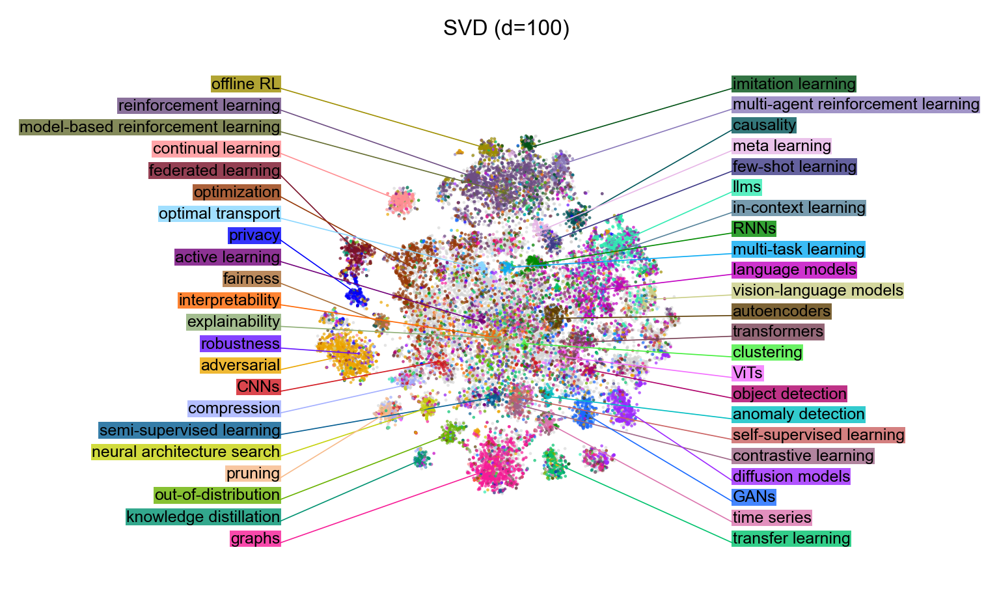

In [14]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=300)
xlim = (-100, 100)
ylim = (-100, 100)
tsne_svd = np.load(variables_path / "updated_dataset" / "tsne_svd.npy")
plot_tsne_colors(tsne_svd, colors_iclr, ax=ax, x_lim=xlim, y_lim=ylim)
plot_label_tags(
    tsne_svd,
    colors_iclr,
    dict_label_to_color,
    x_lim=xlim,
    y_lim=ylim,
    ax=ax,
    subset=False,
    fontsize=6,
    capitalize=False,
)
ax.set_title("SVD (d=100)")
fig.savefig(figures_path / "tsne_iclr_svd_with_tags.png")

Text(0.5, 1.0, 'SVD (d=100)')

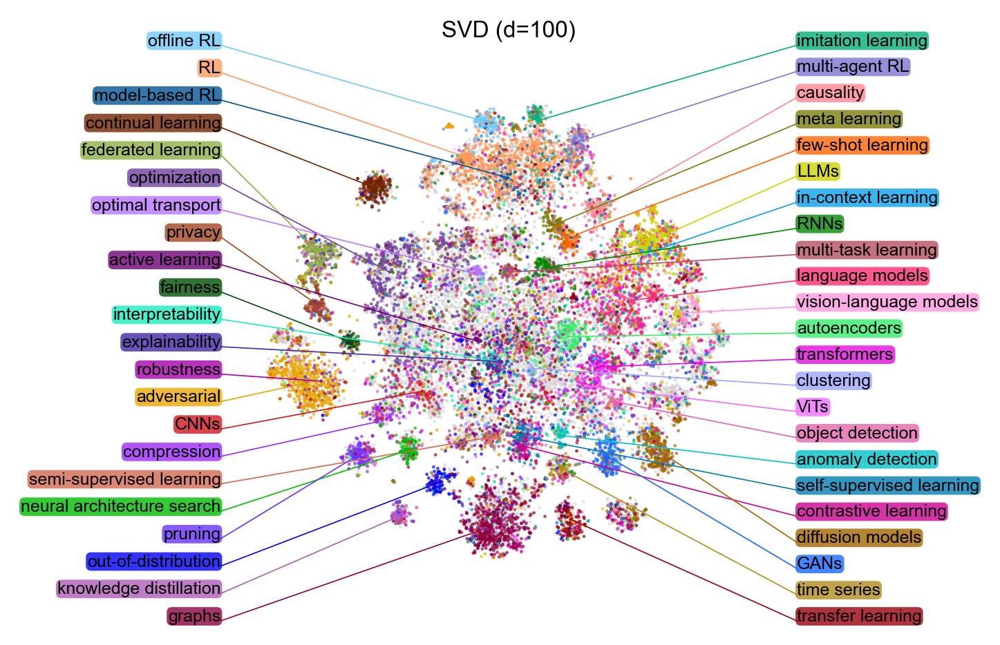

In [50]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=300)
xlim = (-100, 100)
ylim = (-100, 100)
tsne_svd = np.load(variables_path / "updated_dataset" / "tsne_svd.npy")
plot_tsne_colors(tsne_svd, colors_iclr_2, ax=ax, x_lim=xlim, y_lim=ylim)
plot_label_tags(
    tsne_svd,
    colors_iclr_2,
    dict_label_to_color_2,
    x_lim=xlim,
    y_lim=ylim,
    ax=ax,
    subset=False,
    fontsize=6,
    capitalize=False,
)
ax.set_title("SVD (d=100)")
# fig.savefig(figures_path / "tsne_iclr_svd_with_tags_v5.png")

In [68]:
dict_label_to_color

{'CNNs': '#d21820',
 'GANs': '#1869ff',
 'RNNs': '#008a00',
 'ViTs': '#f36dff',
 'active learning': '#710079',
 'adversarial': '#eba600',
 'anomaly detection': '#00bec2',
 'autoencoders': '#5d3d04',
 'causality': '#005559',
 'clustering': '#45ef3d',
 'compression': '#a2aeff',
 'continual learning': '#ff8e92',
 'contrastive learning': '#9e6586',
 'diffusion models': '#9e28ff',
 'explainability': '#8eae75',
 'fairness': '#aa6d35',
 'federated learning': '#791028',
 'few-shot learning': '#3d3986',
 'graphs': '#f71c96',
 'imitation learning': '#005114',
 'in-context learning': '#55829a',
 'interpretability': '#ff6500',
 'knowledge distillation': '#009271',
 'language models': '#c200c2',
 'llms': '#31ebb2',
 'meta learning': '#e7b6e7',
 'model-based reinforcement learning': '#656d31',
 'multi-agent reinforcement learning': '#8a79ba',
 'multi-task learning': '#08aaf3',
 'neural architecture search': '#c6d20c',
 'object detection': '#ae0069',
 'offline RL': '#9e8e00',
 'optimal transport': '#

## RP

In [ ]:
#random_projection = np.load(variables_path / "random_projection.npy")

In [61]:
%%time
%%memit
A = affinity.Uniform(
    random_projection,
    verbose=True,
    method="exact",
    random_state=42,
    k_neighbors=10,
)
tsne_random_projection = TSNE(
    verbose=True, initialization="spectral", random_state=42
).fit(affinities=A)

np.save(
    variables_path / "updated_dataset" / "tsne_random_projection",
    tsne_random_projection,
)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


===> Finding 10 nearest neighbors using exact search using euclidean distance...
   --> Time elapsed: 1.57 seconds
--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, initialization='spectral', random_state=42,
     verbose=True)
--------------------------------------------------------------------------------
===> Calculating spectral initialization...


/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/openTSNE/affinity.py:1219: FutureWarning: Using `mean` symmetrization, but the default behaviour is going to change to `max` in future versions.
  warnings.warn(


   --> Time elapsed: 0.38 seconds
===> Running optimization with exaggeration=12.00, lr=2028.92 for 250 iterations...
Iteration   50, KL divergence 7.4025, 50 iterations in 0.9845 sec
Iteration  100, KL divergence 7.4177, 50 iterations in 1.0224 sec
Iteration  150, KL divergence 7.4066, 50 iterations in 1.0183 sec
Iteration  200, KL divergence 7.4285, 50 iterations in 0.9567 sec


Iteration  250, KL divergence 7.4271, 50 iterations in 1.0120 sec
   --> Time elapsed: 4.99 seconds
===> Running optimization with exaggeration=1.00, lr=24347.00 for 500 iterations...
Iteration   50, KL divergence 5.8394, 50 iterations in 0.9814 sec
Iteration  100, KL divergence 5.5958, 50 iterations in 1.3037 sec
Iteration  150, KL divergence 5.4887, 50 iterations in 2.0183 sec
Iteration  200, KL divergence 5.4279, 50 iterations in 2.9373 sec
Iteration  250, KL divergence 5.3895, 50 iterations in 3.9087 sec
Iteration  300, KL divergence 5.3618, 50 iterations in 4.7161 sec
Iteration  350, KL divergence 5.3430, 50 iterations in 5.4010 sec
Iteration  400, KL divergence 5.3273, 50 iterations in 6.3682 sec
Iteration  450, KL divergence 5.3151, 50 iterations in 7.2062 sec
Iteration  500, KL divergence 5.3053, 50 iterations in 8.5313 sec
   --> Time elapsed: 43.37 seconds
peak memory: 4319.27 MiB, increment: 36.30 MiB
CPU times: user 1min 36s, sys: 21.8 s, total: 1min 58s
Wall time: 51.1 s


In [63]:
%%time
%%memit

knn_accuracy_tsne_random_projection = knn_accuracy(
    tsne_random_projection[labels_iclr != "unlabeled"],
    labels_iclr[labels_iclr != "unlabeled"],
)
np.save(
    variables_path / "updated_dataset" / "knn_accuracy_tsne_random_projection",
    knn_accuracy_tsne_random_projection,
)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


peak memory: 4279.49 MiB, increment: 14.54 MiB
CPU times: user 2.58 s, sys: 2.72 s, total: 5.3 s
Wall time: 705 ms


In [64]:
print(knn_accuracy_tsne_random_projection * 100)

43.230769230769226


Text(0.5, 1.0, 'RP (d=768)')

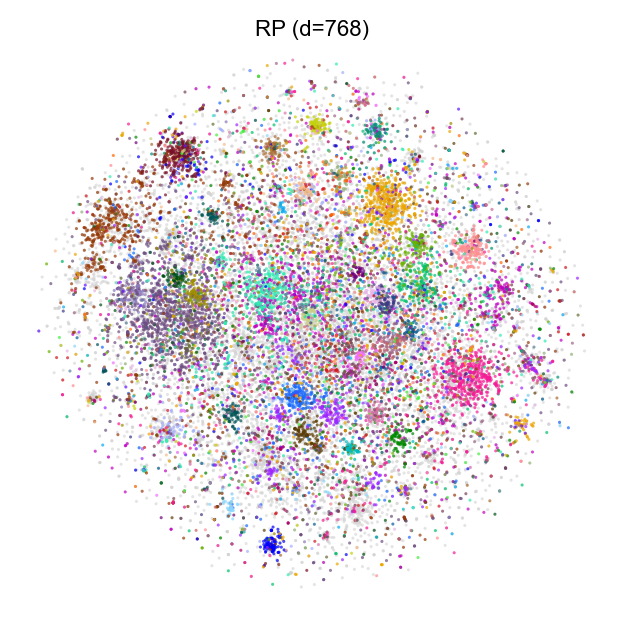

In [65]:
fig, ax = plt.subplots(figsize=(3, 3), dpi=200)

plot_tsne_colors(tsne_random_projection, colors_iclr, ax=ax)
ax.set_title("RP (d=768)")

## Plot

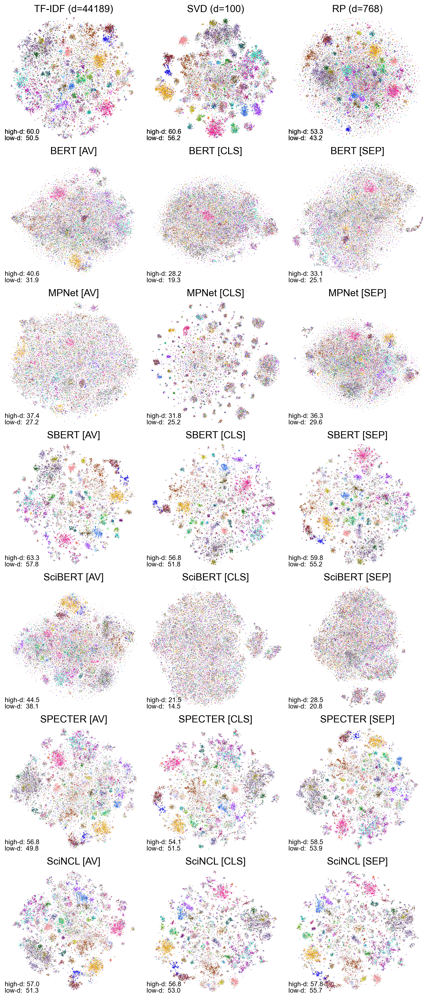

In [13]:
fig, axs = plt.subplots(
    len(model_names) + 1, 3, figsize=(9, 3 * (len(model_names) + 1)), dpi=200
)
rep = ["av", "cls", "sep"]
for i in range(len(model_names) + 1):
    for j in range(3):
        if i == 0:
            # load
            ## tsnes
            tsne_tfidf = np.load(
                variables_path / "updated_dataset" / "tsne_tfidf.npy"
            )
            tsne_svd = np.load(
                variables_path / "updated_dataset" / "tsne_svd.npy"
            )
            tsne_random_projection = np.load(
                variables_path
                / "updated_dataset"
                / "tsne_random_projection.npy"
            )

            ## accuracies
            knn_accuracy_tfidf = np.load(
                variables_path / "updated_dataset" / "knn_accuracy_tfidf.npy"
            )
            knn_accuracy_svd = np.load(
                variables_path / "updated_dataset" / "knn_accuracy_svd.npy"
            )
            knn_accuracy_random_projection = np.load(
                variables_path
                / "updated_dataset"
                / "knn_accuracy_random_projection.npy"
            )

            knn_accuracy_tsne_tfidf = np.load(
                variables_path
                / "updated_dataset"
                / "knn_accuracy_tsne_tfidf.npy"
            )
            knn_accuracy_tsne_svd = np.load(
                variables_path
                / "updated_dataset"
                / "knn_accuracy_tsne_svd.npy"
            )
            knn_accuracy_tsne_random_projection = np.load(
                variables_path
                / "updated_dataset"
                / "knn_accuracy_tsne_random_projection.npy"
            )

            plot_tsne_colors(
                tsne_tfidf, colors_iclr, ax=axs[i, 0], plot_type="subplot_3"
            )
            axs[i, 0].set_title(f"TF-IDF (d=44189)", fontsize=15)

            axs[i, 0].text(
                0,
                0.06,
                f"high-d: {knn_accuracy_tfidf*100:.1f}",
                transform=axs[i, 0].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )
            axs[i, 0].text(
                0,
                0.01,
                f"low-d:  {knn_accuracy_tsne_tfidf*100:.1f}",
                transform=axs[i, 0].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )

            plot_tsne_colors(
                tsne_svd,
                colors_iclr,
                ax=axs[i, 1],
                plot_type="subplot_3",
            )
            axs[i, 1].set_title("SVD (d=100)", fontsize=15)
            axs[i, 1].text(
                0,
                0.06,
                f"high-d: {knn_accuracy_svd*100:.1f}",
                transform=axs[i, 1].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )
            axs[i, 1].text(
                0,
                0.01,
                f"low-d:  {knn_accuracy_tsne_svd*100:.1f}",
                transform=axs[i, 1].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )

            plot_tsne_colors(
                tsne_random_projection,
                colors_iclr,
                ax=axs[i, 2],
                plot_type="subplot_3",
            )
            axs[i, 2].set_title("RP (d=768)", fontsize=15)
            axs[i, 2].text(
                0,
                0.06,
                f"high-d: {knn_accuracy_random_projection*100:.1f}",
                transform=axs[i, 2].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )
            axs[i, 2].text(
                0,
                0.01,
                f"low-d:  {knn_accuracy_tsne_random_projection*100:.1f}",
                transform=axs[i, 2].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )
        else:
            # break
            # load
            ## tsnes
            saving_path = Path(
                "embeddings_" + model_names[i - 1].lower()
            ) / Path("updated_dataset")
            tsne_name = "tsne_" + rep[j] + ".npy"
            tsne = np.load(variables_path / saving_path / tsne_name)

            ## accuracies
            saving_name = Path(
                "knn_accuracy_" + model_names[i - 1].lower() + ".npy"
            )
            knn_acc_highd = np.load(variables_path / saving_name)

            saving_name = Path(
                "knn_accuracy_tsne_" + model_names[i - 1].lower() + ".npy"
            )
            knn_acc_lowd = np.load(
                variables_path / "updated_dataset" / saving_name
            )

            # plot
            plot_tsne_colors(
                tsne, colors_iclr, ax=axs[i, j], plot_type="subplot_3"
            )
            title = model_names[i - 1] + " [" + rep[j].upper() + "]"
            axs[i, j].set_title(title, fontsize=15)
            axs[i, j].text(
                0,
                0.06,
                f"high-d: {knn_acc_highd[j]*100:.1f}",
                transform=axs[i, j].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )
            axs[i, j].text(
                0,
                0.01,
                f"low-d:  {knn_acc_lowd[j]*100:.1f}",
                transform=axs[i, j].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )

fig.savefig(figures_path / "tsne_embeddings_iclr_with_knn_accs_v1.png")